In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc

from scipy.stats import median_abs_deviation

Собираем данные и обязательно транспонируем их. Строки содержат клетки, а колонки набор генов

In [2]:
adata = sc.read_csv('GSM3681518_MNC_RNA_counts.tsv/citeseq_rna_counts.tsv', delimiter="\t")
adata = adata.T
adata

AnnData object with n_obs × n_vars = 33454 × 17009

### Primary filtering

Фильтруем клетки, которые содержат меньше 200 генов и фильтруем гены, которые были найдены в менее чем 3 клетках

In [3]:
print("Cells before:", adata.shape[0])
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
print("Cells after:", adata.shape[0])

Cells before: 33454
Cells after: 33448


Можем оценить выборку из 20 генов, которые больше всего экспрессируются в представленных клетках

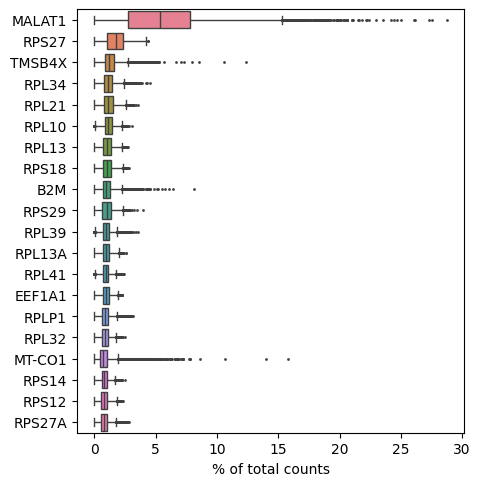

In [4]:
sc.pl.highest_expr_genes(adata, n_top=20)

### Secondary filtering

На данном этапе мы преследуем две цели:
1. Избавиться от пустых дроплетов и дубликатов (`n_genes_by_counts`, `total_counts`)
2. Отфильтровать клетки с высоким процентом митохондриальной ДНК (нам нужны живые)
   
Scanpy предоставляет подсчет набора метрик при помощи функции `calculate_qc_metrics`

Меня больше всего интересуют следующие метрики:

`.obs` level (cells)

- `n_genes_by_counts`: Number of genes with positive counts in a cell
- `total_counts`: Total number of counts for a cell
- `pct_counts_mt`: Percentage of mitochondrial genes

`.var` level (genes)  

In [5]:
# annotate the group of mitochondrial genes as "mt"
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=[20], log1p=True, inplace=True)

Строю violin plot, который содержит информацию 
- Количество генов, экспрессирующихся в нашей матрице
- Набор каунтов для каждой клетки
- Процент митохондриальных генов

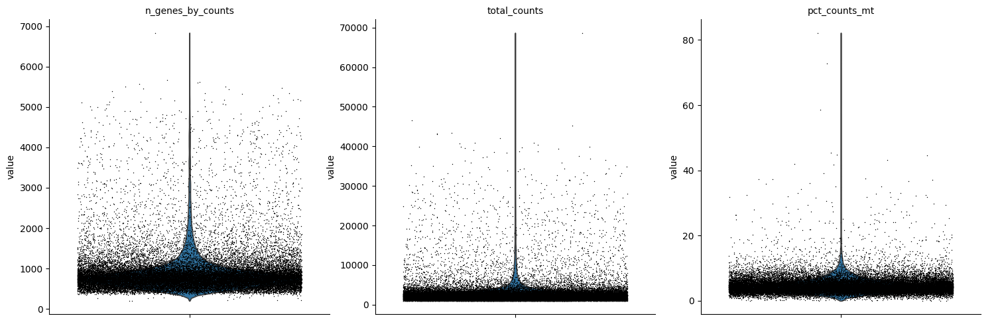

In [6]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

Аналогично строю scatterplots

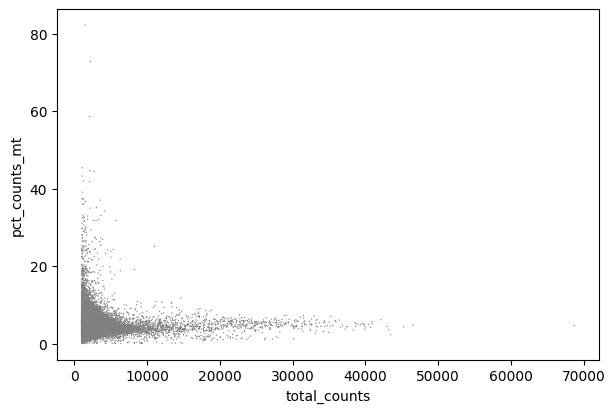

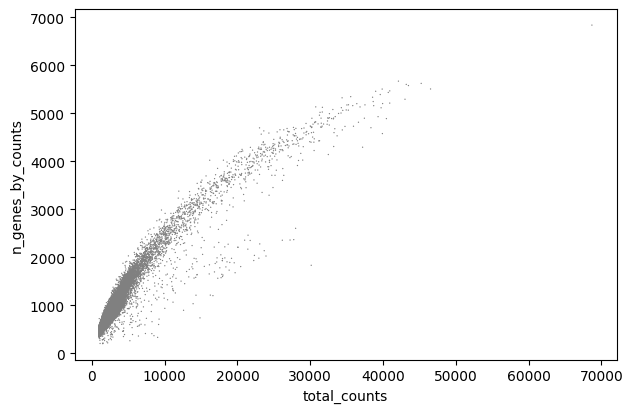

In [7]:
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")

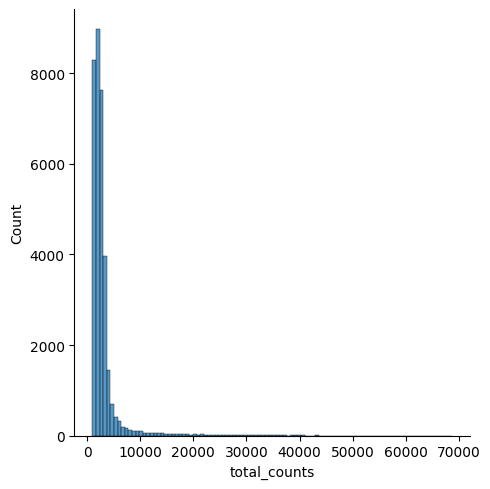

In [8]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)

In [9]:
print('Range of counts')
print(f'Min: {adata.obs["total_counts"].min()} Max: {adata.obs["total_counts"].max()}')
print('')
print('Range of genes per counts')
print(f'Min: {adata.obs["n_genes_by_counts"].min()} Max: {adata.obs["n_genes_by_counts"].max()}')

Range of counts
Min: 999.0 Max: 68687.0

Range of genes per counts
Min: 202 Max: 6836


В best practices есть функция по отбору выбросов, которые мы можем отфильтровать. Пользуюсь этими рекомендациями.

**Фильтрация по количеству каунтов и генов**

Можем определить выбросы, используя log1p трансформированные величины `log1p_total_counts`, `log1p_n_genes_by_counts` и `pct_counts_in_top_20_genes`. Порогом будет 5 MADs (Median Absolute deviation)

In [10]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [11]:
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

outlier
False    31835
True      1613
Name: count, dtype: int64

**Процент митохондриальных генов**

По рекомендации best practice беру 3 MAD в качестве порога (это примерно 8%)

In [12]:
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

mt_outlier
False    30468
True      2980
Name: count, dtype: int64

**Фильтрую полученные выбросы в данных**

In [13]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")

Total number of cells: 33448
Number of cells after filtering of low quality cells: 29035


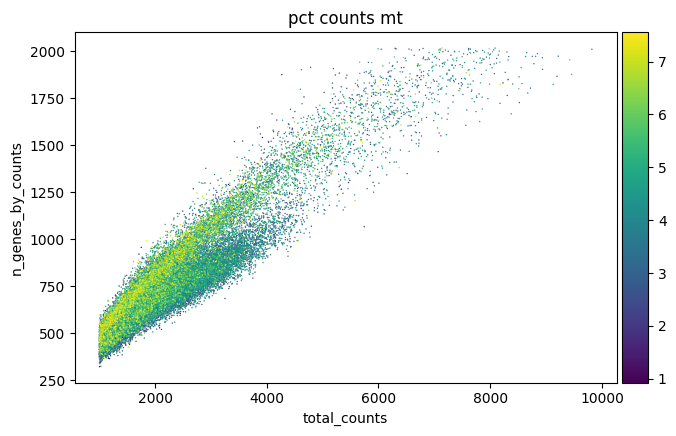

In [14]:
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [15]:
print('Range of counts')
print(f'Min: {adata.obs["total_counts"].min()} Max: {adata.obs["total_counts"].max()}')
print('')
print('Range of genes per counts')
print(f'Min: {adata.obs["n_genes_by_counts"].min()} Max: {adata.obs["n_genes_by_counts"].max()}')

Range of counts
Min: 999.0 Max: 9821.0

Range of genes per counts
Min: 321 Max: 2017


**Ambient RNA**

Избавляемся от молекул РНК в пустых каплях

Основной пакет SoupX. Сначала готовим для него данные, после процессируем в R

anndata2ri нужен для переноса данных single_cell между пакетами (RPy2 converter from AnnData to SingleCellExperiment and back)

In [23]:
#import anndata2ri
#import logging

#import rpy2.rinterface_lib.callbacks as rcb
#import rpy2.robjects as ro

#rcb.logger.setLevel(logging.ERROR)
#ro.pandas2ri.activate()
#anndata2ri.activate()

#%load_ext rpy2.ipython

/var/folders/yn/8b9cs2_s6td7fmf54qzzqlj80000gn/T/ipykernel_11651/3659631106.py:9: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


SoupX убил мне ядро :(

Считаем, что для пустых капель каунтов должно быть на уровне сотен. В нашем случае минимум составляет 999. Больше не буду отсекать левый хвост

**Doublet detection**

Дополнительно проведем проверку на наличие двух клеток в 1 капле

B scanpy есть втроенная [функция](https://scanpy.readthedocs.io/en/stable/api/generated/scanpy.pp.scrublet.html) по определению дуплетов, использующая пакет scrublet

In [16]:
sc.pp.scrublet(adata)

In [17]:
print(f"Total number of cells: {adata.n_obs}")
adata = adata[~adata.obs.predicted_doublet].copy()

print(f"Number of cells after filtering doublets: {adata.n_obs}")

Total number of cells: 29035
Number of cells after filtering doublets: 28825


**Результат QC**

- Было 33454
- Стало 28825

### Normalization

В данном случае взяла 10000, но можно взять 10^6

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)

### Log1p transformation

In [19]:
sc.pp.log1p(adata)

Далее находим наиболее вариабельные гены и работаем с ними

In [20]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

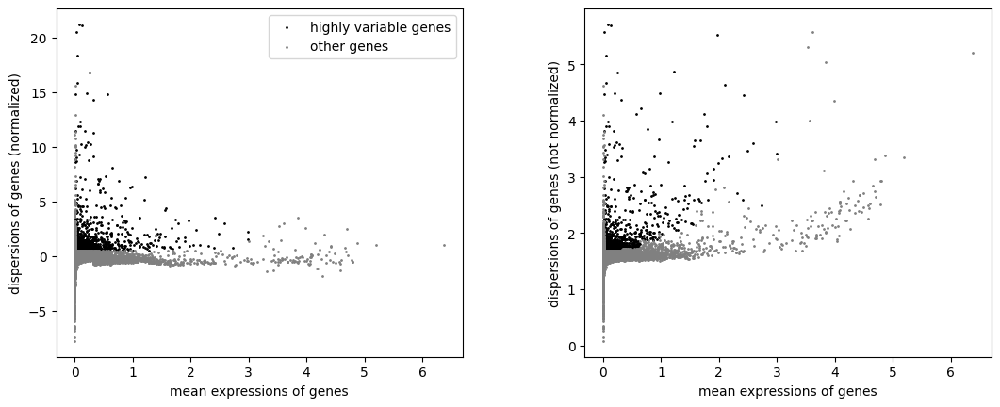

In [21]:
sc.pl.highly_variable_genes(adata)

Сохраняю исходный датасет

In [22]:
adata.raw = adata

Отбираем все высоковариативные гены

In [23]:
adata = adata[:, adata.var.highly_variable]

Нивелируем эффект общего числа каунтов и процента митохондриальных генов

In [24]:
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

/Users/ekaterinashitik/miniforge3/envs/single_cell/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:641: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


### Scaling

In [25]:
sc.pp.scale(adata, max_value=10)

### PCA

In [26]:
sc.tl.pca(adata, svd_solver="arpack")

# sc.pp.pca(adata, svd_solver="arpack", use_highly_variable=True)

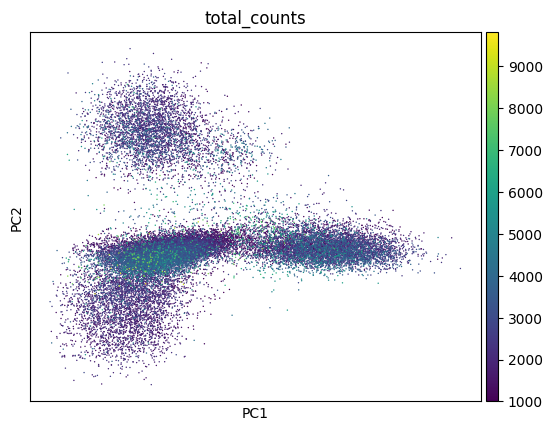

In [27]:
sc.pl.pca_scatter(adata, color="total_counts")

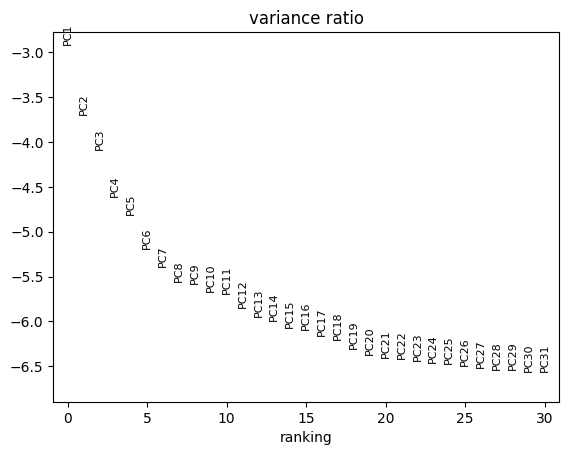

In [28]:
sc.pl.pca_variance_ratio(adata, log=True)

**Оценка на первый взгляд**

В целом 7-8 главных компонент могут нам уже описать представленные данные

### tSNE

Визуализируем полученные данные

In [29]:
sc.tl.tsne(adata, use_rep="X_pca")

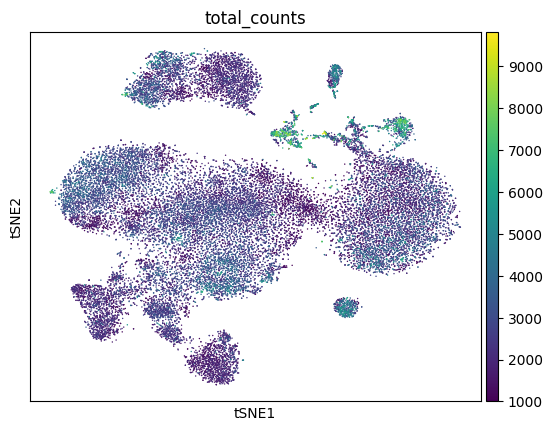

In [30]:
sc.pl.tsne(adata, color="total_counts")

### UMAP

In [31]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

/Users/ekaterinashitik/miniforge3/envs/single_cell/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


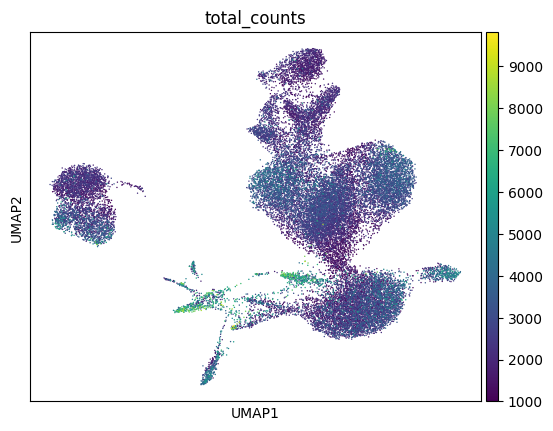

In [32]:
sc.pl.umap(adata, color="total_counts")

**Предварительный вывод**

На tSNE тоже обращают на себя внимание примерно 7 отдельных кластеров. На UMAP тоже обращают на себя внимание примерно 7-8 кластеров.

### Clustering

In [33]:
sc.tl.leiden(
    adata,
    resolution=0.9,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

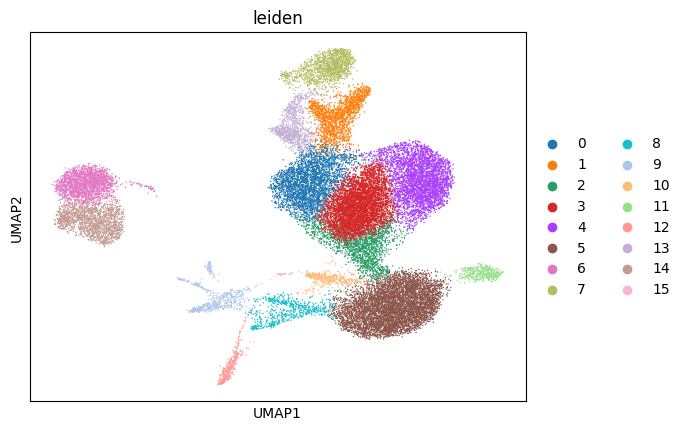

In [35]:
sc.pl.umap(adata, color=["leiden"])

Выглядит не очень.

Попробую другие параметры resolution

In [36]:
sc.tl.leiden(
    adata,
    resolution=0.25,
    key_added="leiden_res0_25",
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)
sc.tl.leiden(
    adata,
    resolution=0.5,
    key_added="leiden_res0_5",
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)
sc.tl.leiden(
    adata,
    resolution=0.7,
    key_added="leiden_res0_7",
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

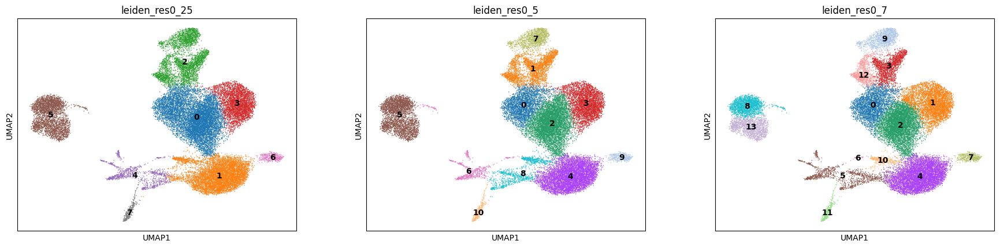

In [37]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res0_7"],
    legend_loc="on data",
)

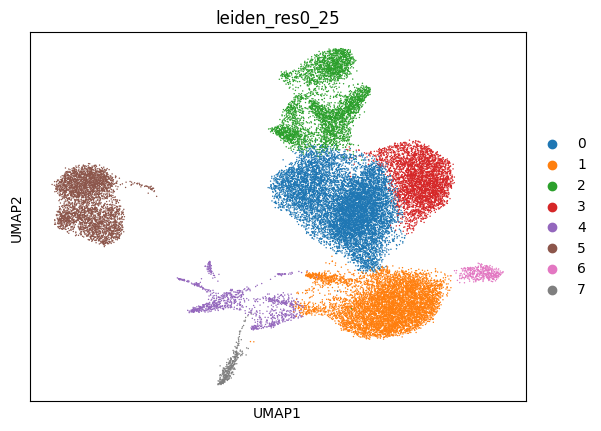

In [38]:
sc.pl.umap(adata, color=["leiden_res0_25"])

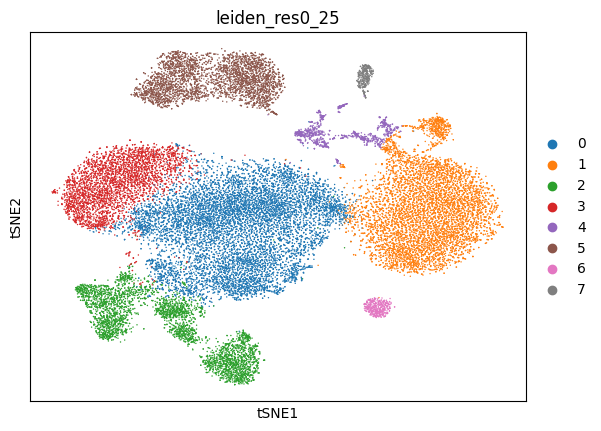

In [40]:
sc.pl.tsne(adata, color="leiden_res0_25")

**Предвариетльный вывод**

Предварительно выглядит, что выборка содержит 6 типов клеток. На картинке они представлены 0, 1, 2, 3, 5, 6. Скорее всего 4 и 7 являются мусором (с 7 не уверена на 100%). Класс 5 содержит два подтипа клеток, а 2 класс - приблизительно 3 подтипа

### Annotation

Использую best practice.

Определяем группы генов, по которым мы можем аннотировать полученные данные

In [43]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [44]:
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [45]:
cts_of_interest = []
for cell_type in marker_genes.keys():
    cts_of_interest.append(cell_type)

cDC1, HSC и MK/E prog выдают ошибки. Поэтому удаляю их из аннотации

In [47]:
del cts_of_interest[3]

In [49]:
del cts_of_interest[-2]

In [50]:
del cts_of_interest[-1]

CD14+ MONO:


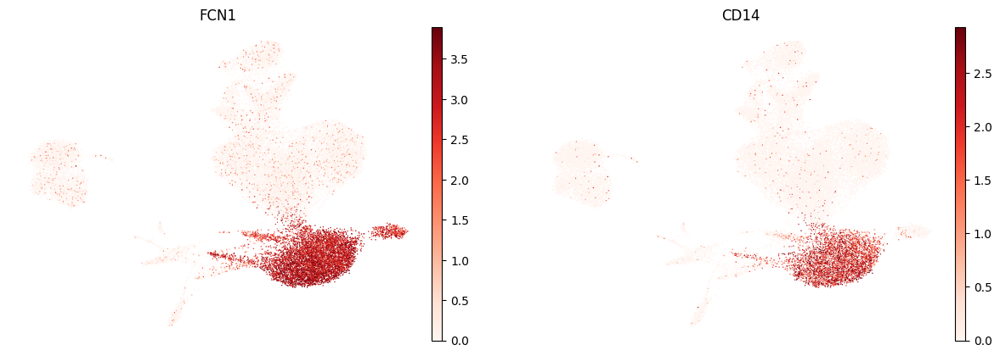





CD16+ MONO:


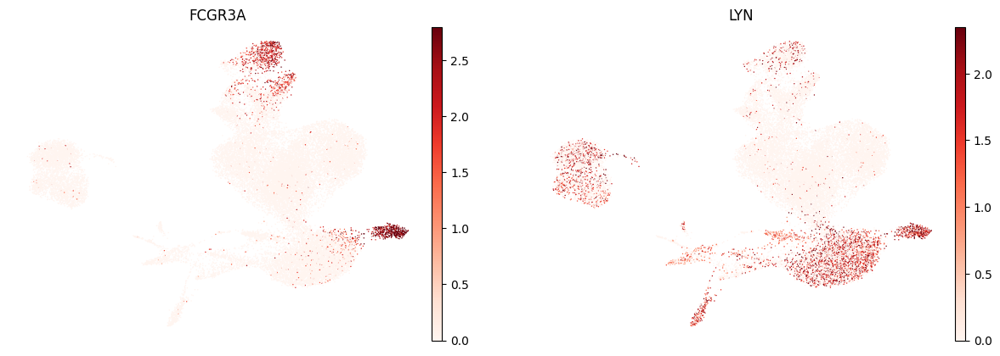





ID2-HI MYELOID PROG:


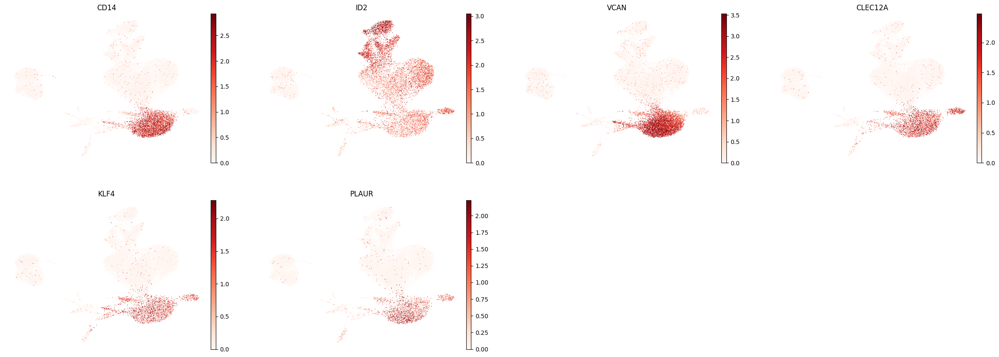





CDC2:


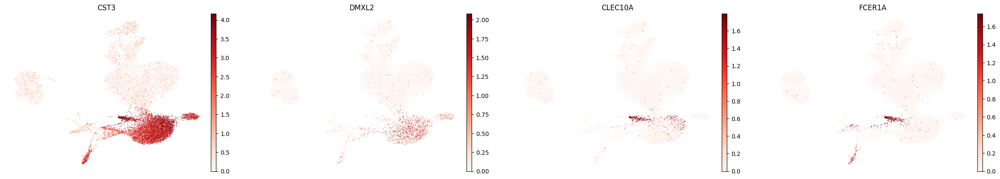





NORMOBLAST:


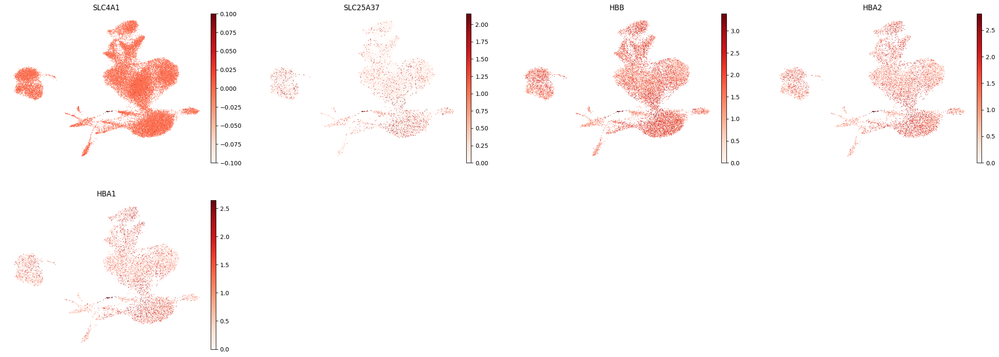





ERYTHROBLAST:


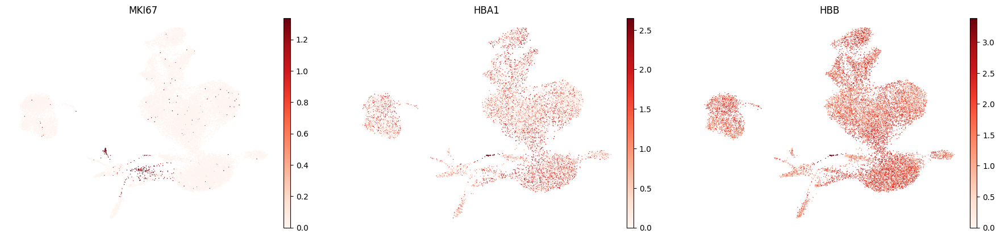





PROERYTHROBLAST:


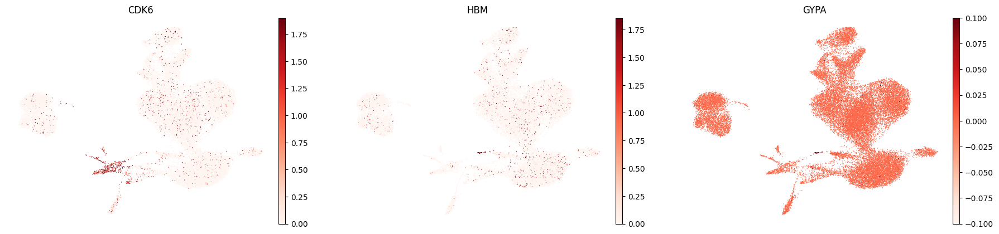





NK:


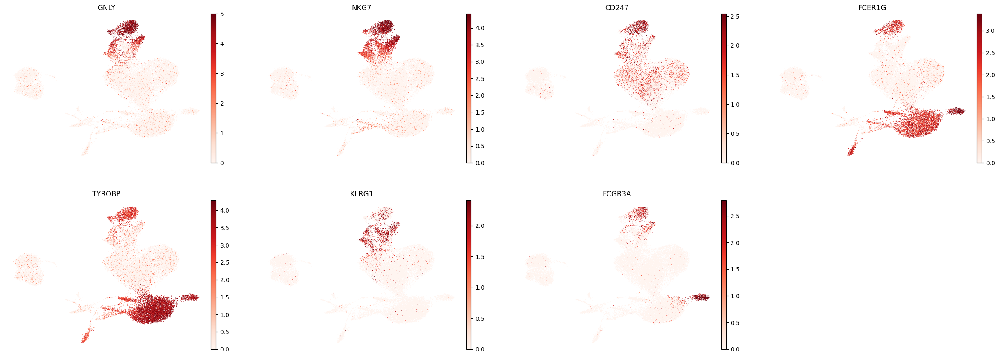





ILC:


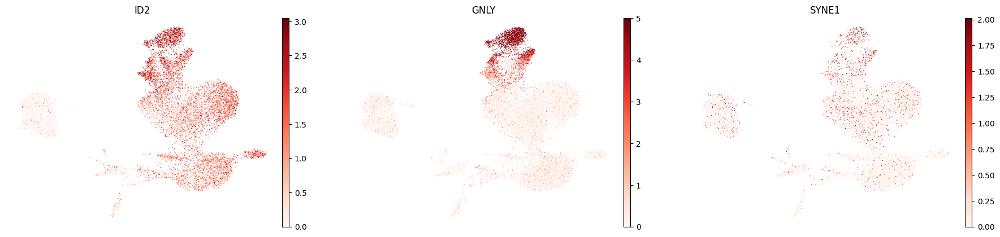





LYMPH PROG:


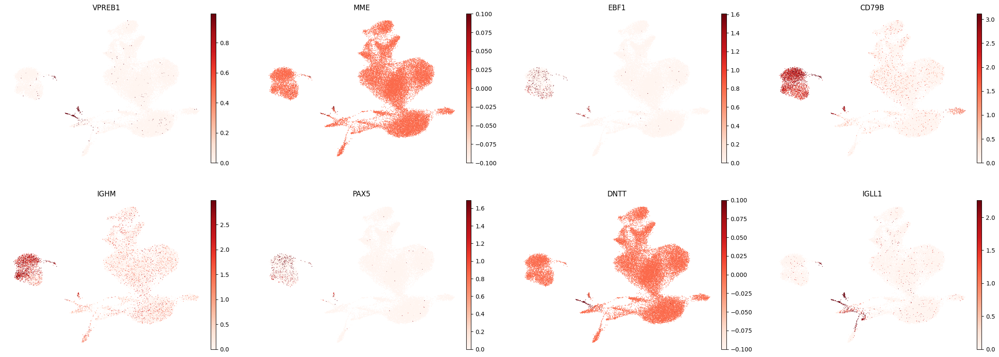





NAIVE CD20+ B:


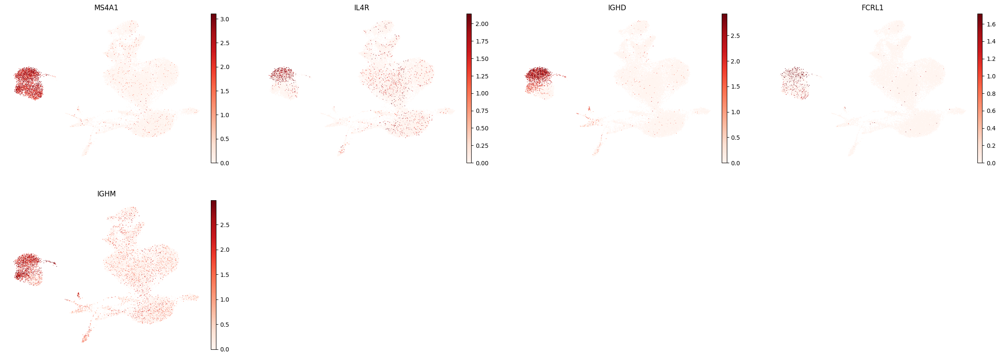





B1 B:


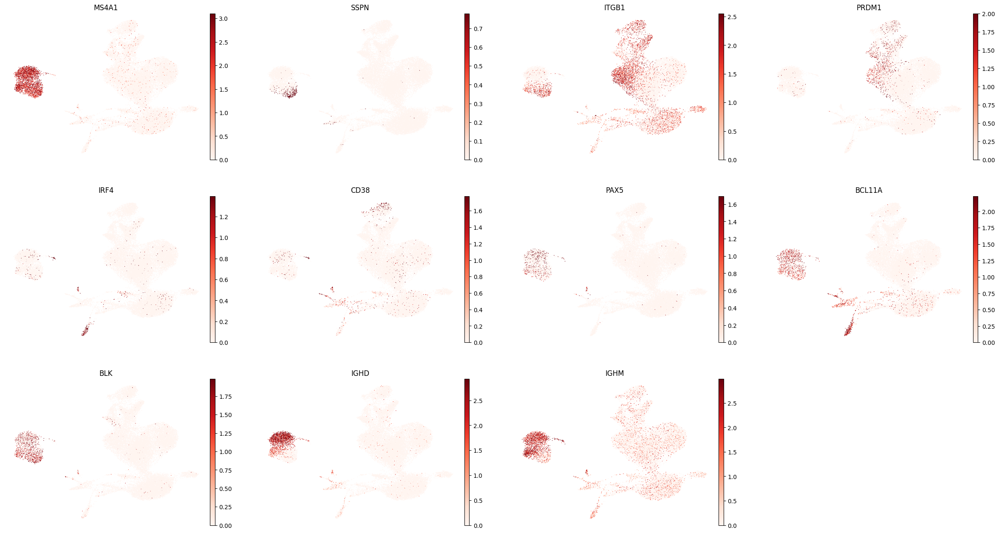





TRANSITIONAL B:


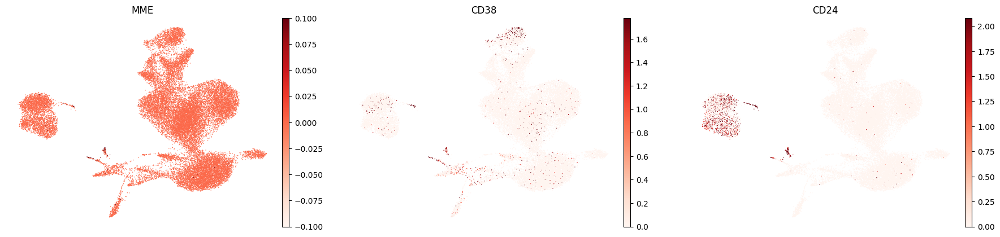





PLASMA CELLS:


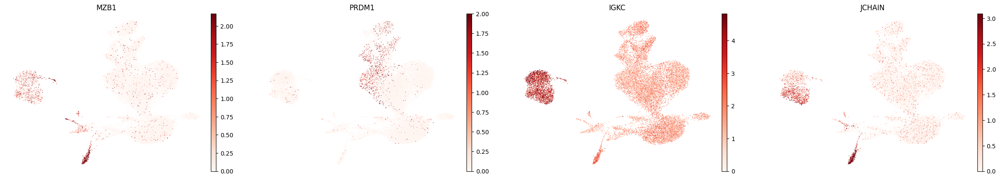





PLASMABLAST:


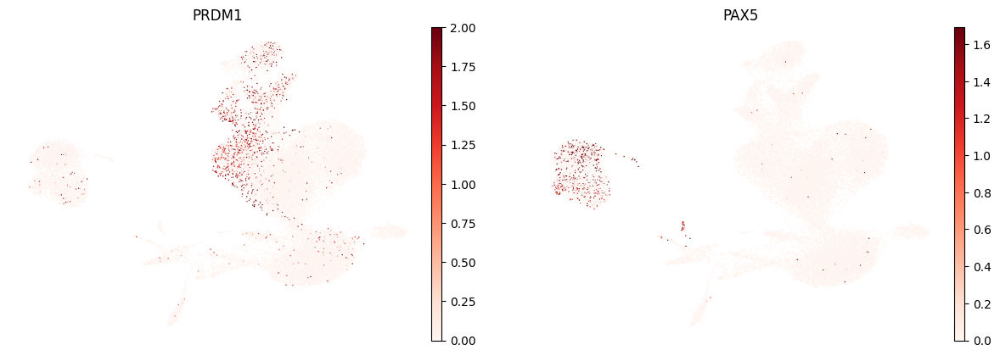





CD4+ T ACTIVATED:


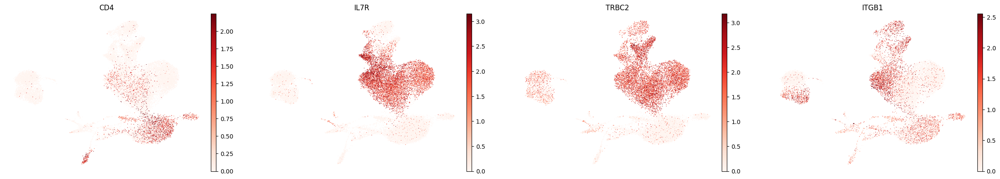





CD4+ T NAIVE:


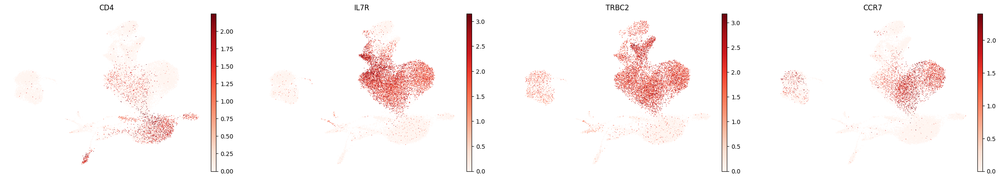





CD8+ T:


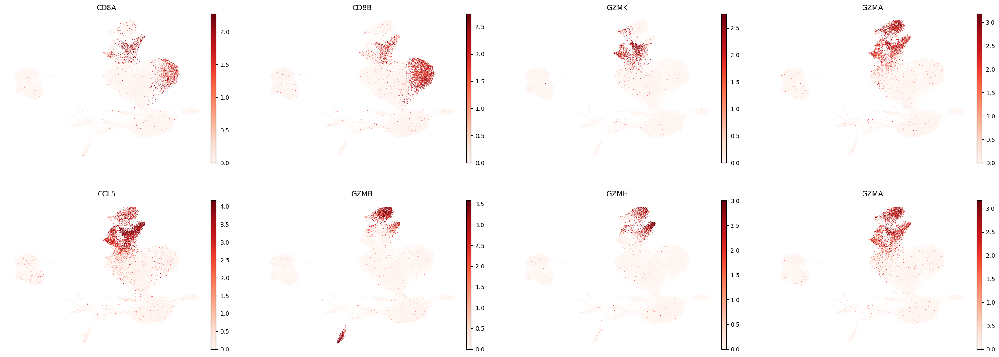





T ACTIVATION:


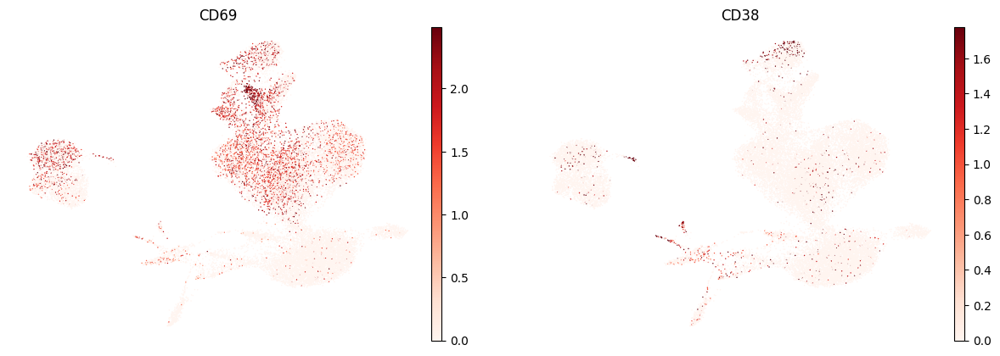





T NAIVE:


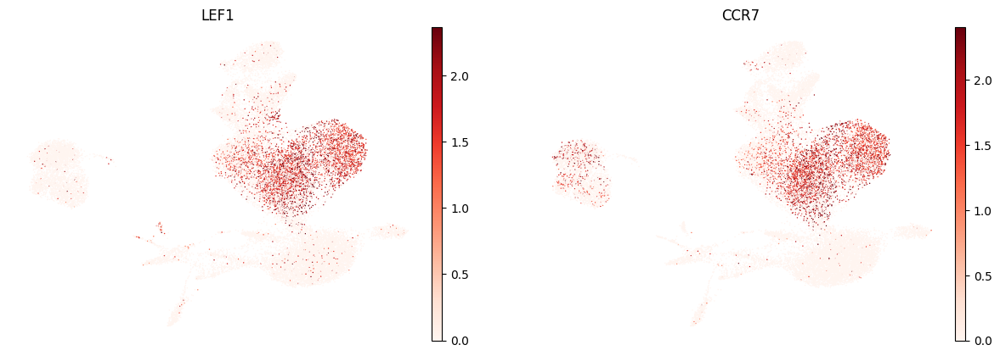





PDC:


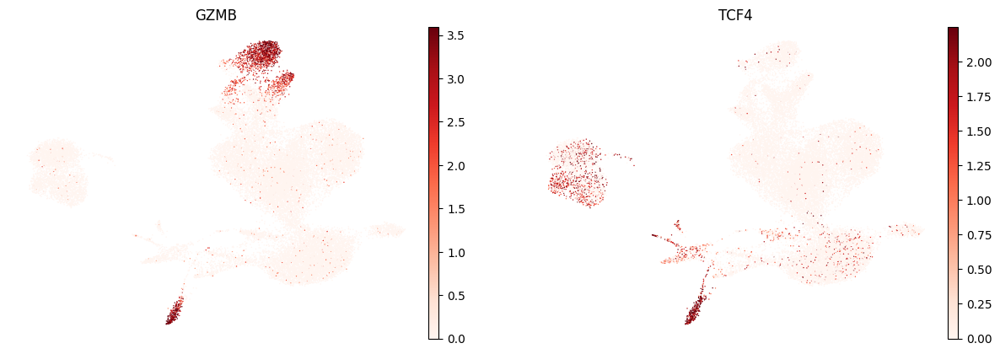





G/M PROG:


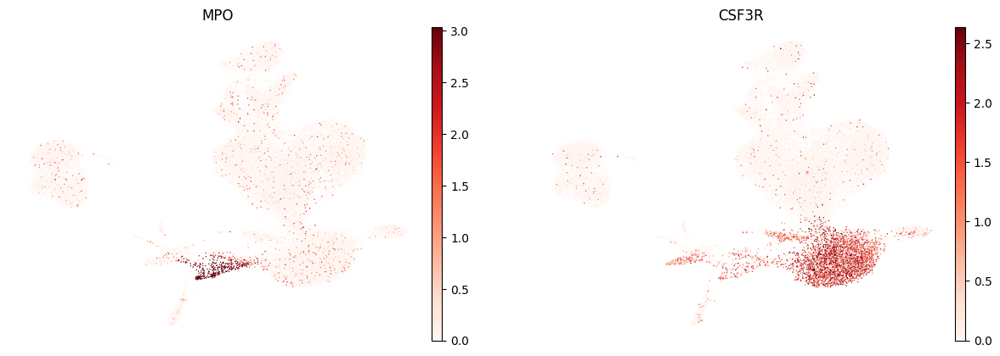

In [51]:
for ct in cts_of_interest:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

Провожу дополнительный анализ:

Перепроверю наиболее очевидные рецепторы и проанализирую разделение NK-клеток и CD8 T-клеток

#### Маркеры на NK клетки

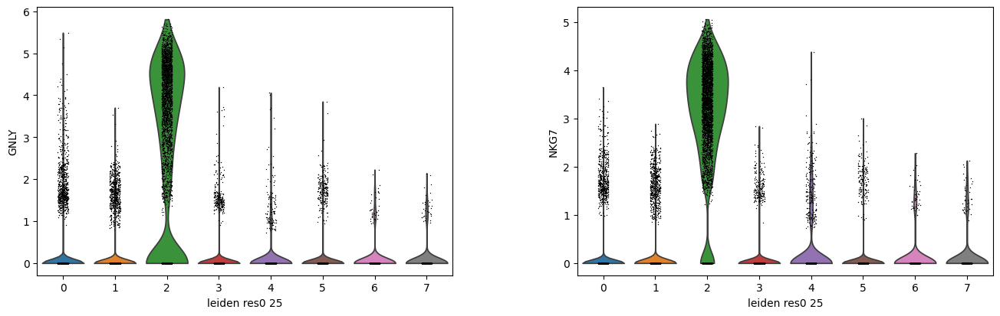

In [56]:
sc.pl.violin(adata, ['GNLY', 'NKG7'], groupby="leiden_res0_25")

#### Маркеры на CD8 T-клетки 

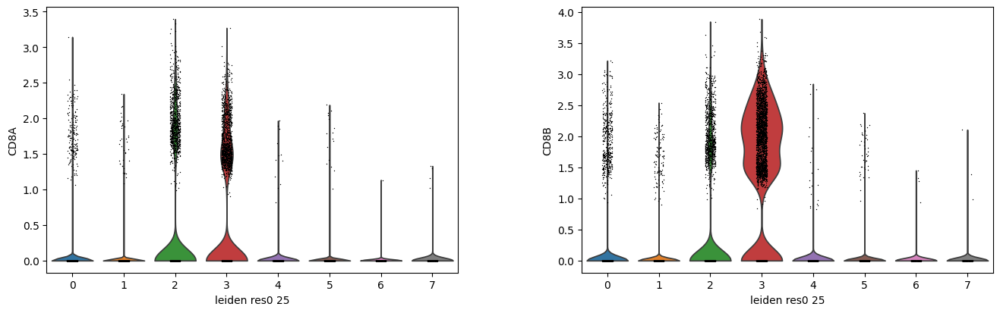

In [64]:
sc.pl.violin(adata, ['CD8A', 'CD8B'], groupby="leiden_res0_25")

#### Маркеры на моноциты CD14

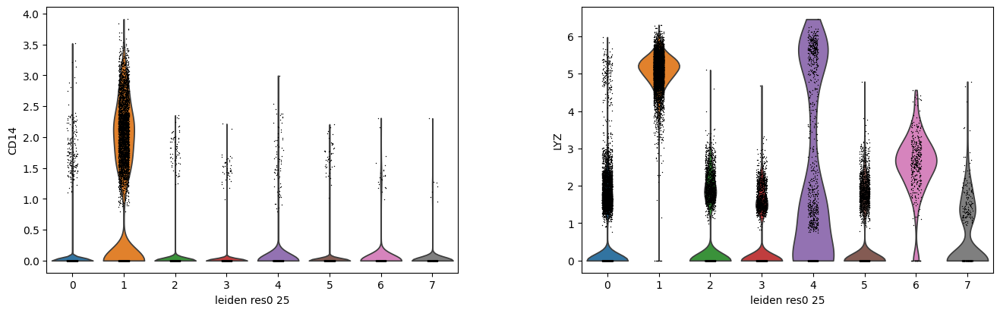

In [59]:
sc.pl.violin(adata, ['CD14', 'LYZ'], groupby="leiden_res0_25")

#### Маркеры на FCGR3A+ моноциты

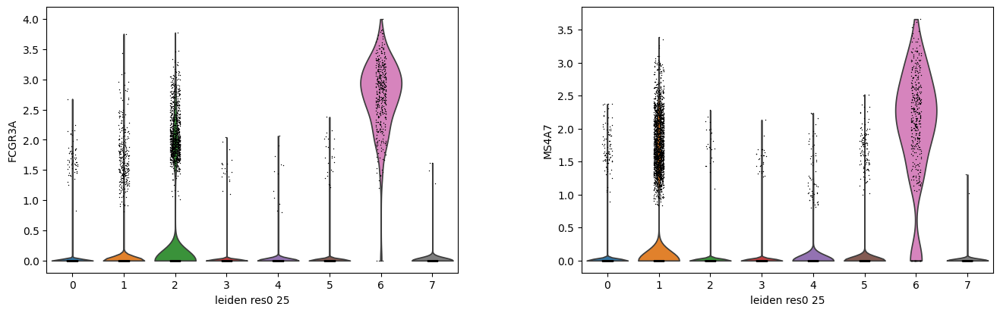

In [67]:
sc.pl.violin(adata, ['FCGR3A', 'MS4A7'], groupby="leiden_res0_25")

#### Маркеры на B-клетки

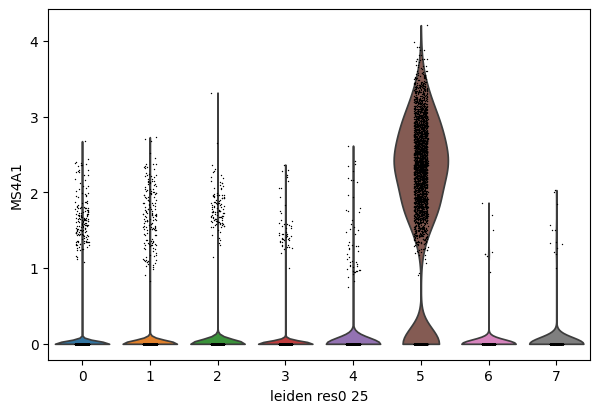

In [60]:
sc.pl.violin(adata, ['MS4A1'], groupby="leiden_res0_25")

#### Маркеры на мегакариоциты

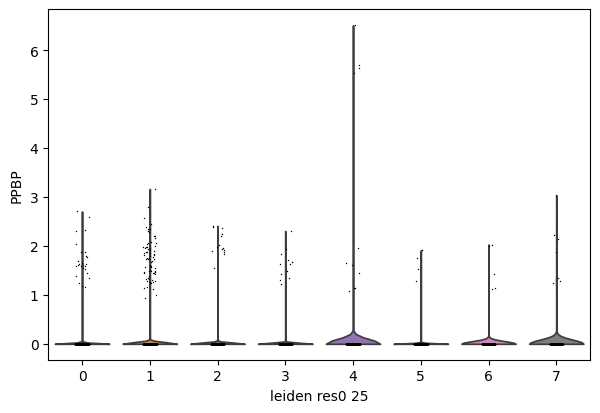

In [61]:
sc.pl.violin(adata, ['PPBP'], groupby="leiden_res0_25")

### Результаты

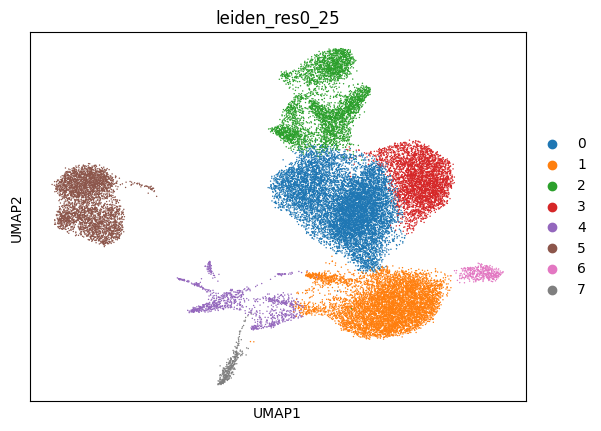

In [62]:
sc.pl.umap(adata, color=["leiden_res0_25"])

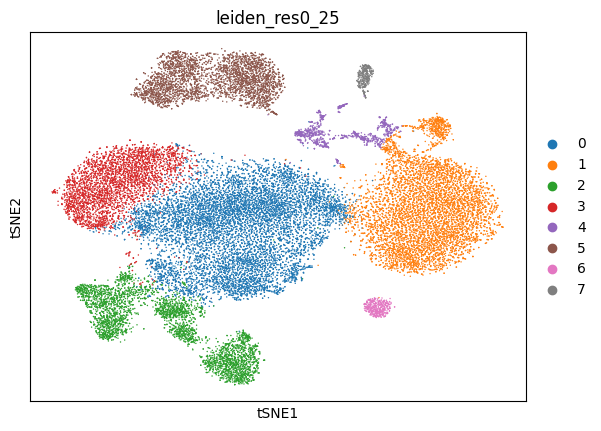

In [63]:
sc.pl.tsne(adata, color="leiden_res0_25")

**Типы представленных клеток**

0. CD4 T клетки (IL7R, TRBC2)
1. Моноциты CD14 (FCN1, CD14, LYZ)
2. NK-клетки (GNLY, NKG7)
3. CD8 T клетки (CD8A, CD8B) - скорее даже второй
4. Мусор
5. B-клетки (MS4A1):
   
   5.1 Наивные (IL4R, IGHD)

   5.2 Зрелые (SSPN, ITGB1)

6. FCGR3A+ моноциты (FCGR3A, MS4A7)
7. Мусор